## __Section 2, Variant 2:__ Automated Droplet Matrix Filtering through Dropkick

The goal of Section 2 is to determine which barcodes within the droplet matrix contain high quality transcriptomic information. This droplet matrix is then filtered to produce a cell matrix, containing only those high quality barcodes. In this variant, we utlize [dropkick](https://github.com/KenLauLab/dropkick) , an open source scRNA-seq filtering algorithm developed by our lab.

---
### __20-22.__ Converting dropEst output and running Dropkick

First we need to install dropkick, either from pip or source at https://github.com/KenLauLab/dropkick.

In [2]:
!pip install dropkick

Next we need to import the python libraries and functions to use in this part of the pipeline, similar to __Step 2v1.1__.

In [1]:
%env PYTHONHASHSEED=0
import QCPipe #Contains functions required for the QC portion of this pipeline
import dropkick as dk #Contains dropkick functions
import scanpy as sc
import numpy as np

In [2]:
sc.set_figure_params(dpi=200) #Set figure size to 200 dpi for legibility
sc.settings.verbosity = 3 #Set scanpy verbosity to 3 for in depth function run information

In [ ]:
import random
np.random.seed(56)
random.seed(56)

In [ ]:
adata = QCPipe.qc.read_dropest("Data")

It's helpful to save this droplet matrix as .h5ad file with compression to save on storage space and convenience for the next time we want to read files.

In [ ]:
adata.write_h5ad("Unfiltered_TNP_Data.h5ad",compression='gzip')

Before running any more QC analyses, we can run dropkick through the command line interface by using the '!' shell command. This enables us to run the dropkick CLI from this notebook. Here we run Dropkick on the previously generated Unfiltered_TNP_Data.h5ad file.

In [6]:
!dropkick run Unfiltered_TNP_Data.h5ad


Reading in unfiltered counts from Unfiltered_TNP_Data.h5ad - 141362 barcodes and 29426 genes
/home/bob/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
Ignoring 66112 barcodes with less than 50 genes detected
Ignoring 45 genes with zero total counts
/home/bob/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
Top 10 ambient genes have dropout rates between 0.0 and 0.498 percent:
	['MT-RNR2', 'MT-CO3', 'MT-CO1', 'MT-ND4', 'MT-CYB', 'MT-ND1', 'MT-ATP6', 'MT-CO2', 'MT-ND2', 'MT-ND3']
Determining 2000 highly variable genes
Setting arcsinh_norm layer to .X
Thresholding on heuristics for training labels:
	['arcsinh_n_genes_by_counts']
/home/bob/.local/l

The above step generates a file with "dropkick" appended to its filename. We can read that data in as it is the output of Dropkick, with each cell annotated with both a dropkick score and label. 

---
### __23.__ Verifying dropkick scores and generating a filtered cell matrix

In [ ]:
adata = sc.read_h5ad("Unfiltered_TNP_Data_dropkick.h5ad")

Now we can proceed as normal to verify that the dropkick-predicted scores and labels are consistent with the biological processes detected in our single cells of interest.

---
### Refer to Step 2, Variant 1 for these following steps.

Calculating QC Metrics
Inflection point at [20549 38670 56792] for [0, 15, 30] percentiles of greatest secant distances


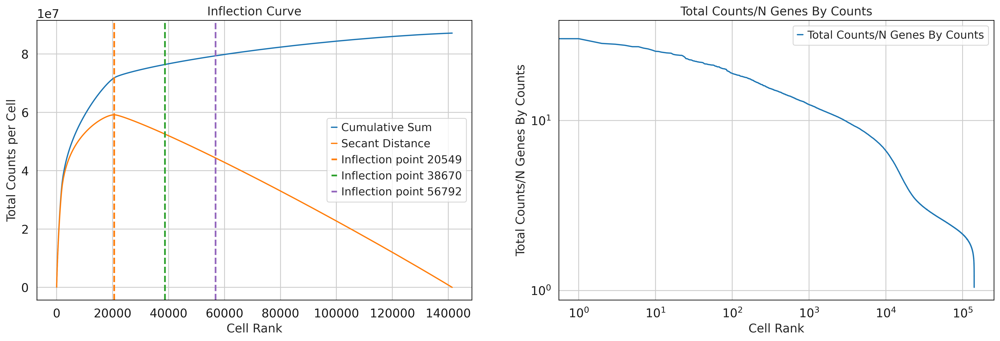

In [6]:
inf = QCPipe.qc.find_inflection(adata)

After estimating this inflection point and storing it in the variable 'inf' we use that point to subset our data based on that determined minimum quality threshold. This inflection point estimation function also calculates several generic quality control metrics for the dataset. This is seen when printing the contents of 'adata', and the 'obs' attribute is shown to contain information like 'n_genes_by_counts'

In [7]:
sc.pp.filter_cells(adata,min_counts=adata[inf[0]].obs.total_counts[0]) ; adata

filtered out 120809 cells that have less than 619.0 counts


/home/bob/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


AnnData object with n_obs × n_vars = 20553 × 29426
    obs: 'total_counts', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'n_counts'
    var: 'dropkick_coef', 'Mitochondrial', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'Order', 'dropkick_args', 'dropkick_thresholds'

In order to visualize and perform further analyses on this droplet matrix, we must normalize the data first.

In [8]:
sc.pp.normalize_total(adata) #Normalize data by the median counts per single cell library
adata.X = np.arcsinh(adata.X).copy() #Transform the data by using an inverse hyperbolic sine transform, this eliminates the need for adding a pseudocount 
sc.pp.scale(adata) #Scale and center the data for interpretability

normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


The data should then be linearly decomposed with PCA, to aid in its downstream processing.

In [9]:
sc.pp.pca(adata,random_state=0)

computing PCA
    with n_comps=50
    finished (0:01:02)


Next, the a KNN needs to be generated. This graphical representation is used in the determination of Leiden communities and non-linear dimension reduction such as UMAP.

In [10]:
neighborhood_k = np.sqrt(adata.n_obs).astype(int) #We have found that scaling the K to equal the square root of the total number of neighbors to be effective
sc.pp.neighbors(adata,n_neighbors=neighborhood_k,use_rep='X_pca',random_state=0) #Calculate this KNN based off of the PCA distances

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:57)


The KNN calculation and the following UMAP calculation can be fairly time consuming, so it is suggested that the 2 dimensional UMAP coordinates are saved to file if the user wishes to halt analyses and continue later.

In [11]:
sc.tl.umap(adata,min_dist=0.25,random_state=0)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)


In [12]:
#pd.DataFrame(adata.obsm['X_umap']).to_csv("X_umap.csv") #This saves the UMAP coordinates to a .csv file
#adata.obsm['X_umap'] = pd.read_csv("X_umap.csv",index_col=0).values #This reads the UMAP coordinates from the above .csv file

Now we perform the Leiden community detection algorithm on the determined KNN as a way to segment the droplets in a data-driven way. This makes it easier for us to select specific, high quality cells contained in droplets in downstream steps.

In [13]:
sc.tl.leiden(adata,resolution=2,random_state=0) #Here we use a resolution of 2, which should yield 30+ clusters. This step may take a while.

running Leiden clustering
    finished: found 33 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:28)


Finally, we visualize all these information together for the subsequent heuristic cluster selection steps. First we visualize normalized gene expression values over the 2 dimensional UMAP. These genes are tailored, from literature review, to be representative of known subpopulations within the colonic epithelium.

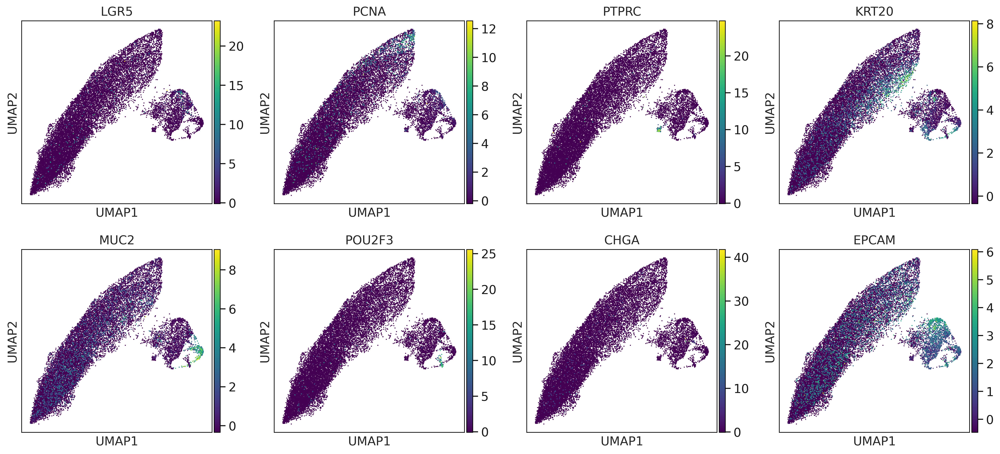

In [14]:
sc.pl.umap(adata,color=['LGR5','PCNA','PTPRC','KRT20','MUC2','POU2F3','CHGA','EPCAM'],use_raw=False,cmap='viridis')

Second, we visualize our calculated QC metrics as well as our dropkick-based metrics and labels.

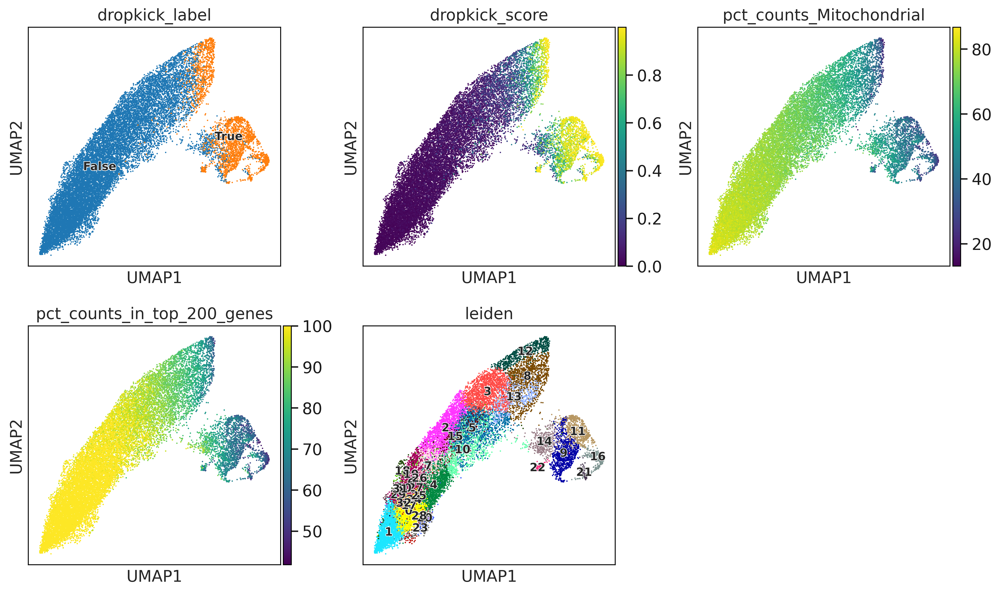

In [15]:
sc.pl.umap(adata,color=['dropkick_label','dropkick_score','pct_counts_Mitochondrial','pct_counts_in_top_200_genes','leiden'],legend_loc='on data',legend_fontoutline=True,legend_fontsize=10,cmap='viridis',ncols=3)

After verifying that the automatically generated dropkick labels are likely high quality cells (through heuristics defined in Step 2, Variant 1, we can now subset the data such that we generate a cell matrix with raw counts that can be used as an entry point for downstream scRNA-seq analyses, such as those laid out in Step 3 of this protocol.

In [42]:
adata.obs['dropkick_label'] = (adata.obs['dropkick_label'] == 'True')
data_out = QCPipe.qc.subset_cleanup(adata,selection='dropkick_label')  
#Instead of "Cell_Selection" we can use 'dropkick_label' after converting the observation into a boolean vector

/home/bob/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [43]:
data_out

AnnData object with n_obs × n_vars = 3041 × 29426

In [44]:
data_out.write_h5ad("Filtered_TNP_Data_dropkick.h5ad",compression='gzip')